# Group: Food Access in Washington D.C.
### Research Questions: 
What is the overall food landscape for the Washington D.C.? Does healthy food access vary across wards? If so, how might this impact different demographics? Are there areas that have greater access to healthy food? Are there areas that have a higher concentration of unhealthy food options? What are important indicators of healthy and unhealthy food access?

### Data Sources:
Census Data: Social Explorer ACS 2020 Survey Data; Food Indicators: Open Data DC

### Produced by Emily Biro 

I first imported pandas, plotly.express, geopandas, contextily, and matplotlib to begin data exploration

In [2]:
import pandas as pd
import plotly.express as px
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt

Let's import the two data files with the healthy corner stores locations and grocery store locations in DC

In [3]:
healthy = pd.read_csv('Healthy_Corner_Stores.csv')
grocery = pd.read_csv('Grocery_Store_Locations.csv')

Now taking a closer look at the data and cleaning it up to only show columns we are most interested in and getting rid of any blank rows

In [4]:
healthy.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   X          71 non-null     float64
 1   Y          71 non-null     float64
 2   OBJECTID   71 non-null     int64  
 3   STORE      71 non-null     object 
 4   ADDRESS    71 non-null     object 
 5   XCOORD     71 non-null     float64
 6   YCOORD     71 non-null     float64
 7   MATCHTYPE  71 non-null     object 
 8   MAR_ID     68 non-null     float64
 9   LATITUDE   68 non-null     float64
 10  LONGITUDE  68 non-null     float64
 11  GIS_ID     71 non-null     object 
 12  GLOBALID   71 non-null     object 
 13  CREATOR    0 non-null      float64
 14  CREATED    0 non-null      float64
 15  EDITOR     0 non-null      float64
 16  EDITED     0 non-null      float64
dtypes: float64(11), int64(1), object(5)
memory usage: 9.6+ KB


In [5]:
grocery.head()

,X,Y,STORENAME,ADDRESS,ZIPCODE,PHONE,WARD,SSL,NOTES,PRESENT90,...,XCOORD,YCOORD,MAR_ID,SE_ANNO_CAD_DATA,GLOBALID,CREATOR,CREATED,EDITOR,EDITED,PRESENT22
0,-77.026981,38.984455,Target,7828 GEORGIA AVENUE NW,20012,2028923822,Ward 4,2960 0017,NaN,NaN,...,397662.57,146280.07,300512,NaN,{CE302122-4E8D-4DC7-845B-06563B993F66},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes
1,-77.026066,38.983464,International Progresso Market,7719 GEORGIA AVENUE NW,20012,2025455015,Ward 4,2961 0810,NaN,NaN,...,397741.80,146169.97,285417,NaN,{2C18863D-40DE-4F66-AA59-46F1C65D67F2},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes
2,-77.027798,38.967771,Jocelyn’s Market,6404 GEORGIA AVENUE NW,20012,2027227574,Ward 4,2945 0839,NaN,NaN,...,397591.16,144428.00,285334,NaN,{A0B448C3-B3FB-49FE-B8BF-1FEBA3CEA642},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes
3,-77.076459,38.965553,Magruder's,5626 CONNECTICUT AVENUE NW,20015,2024644946,Ward 3,1860 0013,,Yes,...,393373.92,144184.19,263860,NaN,{9ABE1C46-BB48-4110-B5BA-C6363CA3BD7A},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes
4,-77.074910,38.964601,Safeway,5545 CONNECTICUT AVENUE NW,20015,2022446097,Ward 3,1867 0092,,No,...,393508.13,144078.34,263999,NaN,{902F540E-FE16-43A5-8010-CD84E94B28B7},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes


In [6]:
desired_columns_healthy = ['STORE','ADDRESS','LATITUDE','LONGITUDE']

In [7]:
healthy[desired_columns_healthy].sample(5)

,STORE,ADDRESS,LATITUDE,LONGITUDE
25,McKinley Market,321 T Street NE,38.915302,-77.000995
42,Minnesota Food Mart,3728 Minnesota Ave NE,38.891109,-76.952487
0,BP Blaire Gas Station,7000 Blair Rd NW,38.975039,-77.019077
34,Bodega Market,1136 Florida Ave NE,38.903039,-76.990354
17,Uptown Market,2701 14th St NW,38.925024,-77.032053


In [8]:
healthy_trimmed = healthy[desired_columns_healthy].copy()

In [9]:
grocery.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82 entries, 0 to 81
Data columns (total 36 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   X                 82 non-null     float64
 1   Y                 82 non-null     float64
 2   STORENAME         82 non-null     object 
 3   ADDRESS           82 non-null     object 
 4   ZIPCODE           82 non-null     int64  
 5   PHONE             82 non-null     int64  
 6   WARD              82 non-null     object 
 7   SSL               82 non-null     object 
 8   NOTES             53 non-null     object 
 9   PRESENT90         55 non-null     object 
 10  PRESENT95         55 non-null     object 
 11  PRESENT00         55 non-null     object 
 12  PRESENT05         55 non-null     object 
 13  PRESENT08         55 non-null     object 
 14  PRESENT09         55 non-null     object 
 15  PRESENT10         55 non-null     object 
 16  PRESENT11         55 non-null     object 
 17 

In [10]:
desired_columns_grocery = ['STORENAME','ADDRESS','Y','X']

In [11]:
grocery_trimmed = grocery[desired_columns_grocery].copy()

I want to combine the healthy corner store and grocery store data, but I want to still be able to distinguish which type a data entry is, so I am also adding a new column to indicate what type of store it is

In [12]:
grocery_trimmed['Type']= 'grocery'

In [13]:
healthy_trimmed ['Type']= 'healthy'

In [14]:
healthy_trimmed 

,STORE,ADDRESS,LATITUDE,LONGITUDE,Type
0,BP Blaire Gas Station,7000 Blair Rd NW,38.975039,-77.019077,healthy
1,Missouri Avenue Market,5900 Georgia Ave NW,38.961518,-77.028429,healthy
2,Capital View Convenience Store,12 Kennedy St NW,38.956431,-77.010353,healthy
3,S&G Liquor and Grocery,5421 Georgia Ave NW,38.955817,-77.027747,healthy
4,Starlight Food,5424 5th St NW,NaN,NaN,healthy
...,...,...,...,...,...
66,Holiday Market,3509 Wheeler Rd SE,38.839188,-76.993966,healthy
67,Wheeler Market,4133 Wheeler Rd SE,38.833556,-76.990215,healthy
68,Secrets of Nature,3923 South Capitol St SW,38.831995,-77.008576,healthy
69,Chesapeake Big Market,601 Chesapeake St SE,38.828998,-76.998290,healthy


In [15]:
healthy_trimmed = healthy_trimmed.dropna()

In [16]:
grocery_trimmed.columns.to_list()

['STORENAME', 'ADDRESS', 'Y', 'X', 'Type']

In [17]:
grocery_trimmed.columns = ['STORE', 'ADDRESS', 'LATITUDE', 'LONGITUDE', 'Type']

In [18]:
grocery_trimmed

,STORE,ADDRESS,LATITUDE,LONGITUDE,Type
0,Target,7828 GEORGIA AVENUE NW,38.984455,-77.026981,grocery
1,International Progresso Market,7719 GEORGIA AVENUE NW,38.983464,-77.026066,grocery
2,Jocelyn’s Market,6404 GEORGIA AVENUE NW,38.967771,-77.027798,grocery
3,Magruder's,5626 CONNECTICUT AVENUE NW,38.965553,-77.076459,grocery
4,Safeway,5545 CONNECTICUT AVENUE NW,38.964601,-77.074910,grocery
...,...,...,...,...,...
77,Safeway,322 40TH STREET NE,38.893140,-76.947457,grocery
78,Yes! Organic,2323 PENNSYLVANIA AVENUE SE,38.874133,-76.972748,grocery
79,Wegmans,41 RIDGE SQUARE NW,38.940451,-77.077266,grocery
80,Lidl,2224 TOWN CENTER DRIVE SE,38.861766,-76.967401,grocery


In [19]:
grocery_trimmed = grocery_trimmed.dropna()

Now that the data is cleaned up, I am ready to combine!

In [20]:
all_stores = pd.concat([grocery_trimmed, healthy_trimmed], axis=0)

In [21]:
all_stores

,STORE,ADDRESS,LATITUDE,LONGITUDE,Type
0,Target,7828 GEORGIA AVENUE NW,38.984455,-77.026981,grocery
1,International Progresso Market,7719 GEORGIA AVENUE NW,38.983464,-77.026066,grocery
2,Jocelyn’s Market,6404 GEORGIA AVENUE NW,38.967771,-77.027798,grocery
3,Magruder's,5626 CONNECTICUT AVENUE NW,38.965553,-77.076459,grocery
4,Safeway,5545 CONNECTICUT AVENUE NW,38.964601,-77.074910,grocery
...,...,...,...,...,...
66,Holiday Market,3509 Wheeler Rd SE,38.839188,-76.993966,healthy
67,Wheeler Market,4133 Wheeler Rd SE,38.833556,-76.990215,healthy
68,Secrets of Nature,3923 South Capitol St SW,38.831995,-77.008576,healthy
69,Chesapeake Big Market,601 Chesapeake St SE,38.828998,-76.998290,healthy


## Maps

Let's take a look at this data in a map format, zoomed into DC

In [22]:
import folium

In [23]:
m = folium.Map(location=[38.9072, -77.0369], zoom_start=11)
m

I am assigning different colors to each type of store to be able to distinguish on the map- I think beige and green would demonstrate clearly the differences among store types

In [24]:
all_stores['color'] = ''

In [25]:
all_stores

,STORE,ADDRESS,LATITUDE,LONGITUDE,Type,color
0,Target,7828 GEORGIA AVENUE NW,38.984455,-77.026981,grocery,
1,International Progresso Market,7719 GEORGIA AVENUE NW,38.983464,-77.026066,grocery,
2,Jocelyn’s Market,6404 GEORGIA AVENUE NW,38.967771,-77.027798,grocery,
3,Magruder's,5626 CONNECTICUT AVENUE NW,38.965553,-77.076459,grocery,
4,Safeway,5545 CONNECTICUT AVENUE NW,38.964601,-77.074910,grocery,
...,...,...,...,...,...,...
66,Holiday Market,3509 Wheeler Rd SE,38.839188,-76.993966,healthy,
67,Wheeler Market,4133 Wheeler Rd SE,38.833556,-76.990215,healthy,
68,Secrets of Nature,3923 South Capitol St SW,38.831995,-77.008576,healthy,
69,Chesapeake Big Market,601 Chesapeake St SE,38.828998,-76.998290,healthy,


In [26]:
all_stores.loc[all_stores['Type'] == 'grocery', 'color'] = 'beige'
all_stores.loc[all_stores['Type'] == 'healthy', 'color'] = 'green'

In [27]:
all_stores

,STORE,ADDRESS,LATITUDE,LONGITUDE,Type,color
0,Target,7828 GEORGIA AVENUE NW,38.984455,-77.026981,grocery,beige
1,International Progresso Market,7719 GEORGIA AVENUE NW,38.983464,-77.026066,grocery,beige
2,Jocelyn’s Market,6404 GEORGIA AVENUE NW,38.967771,-77.027798,grocery,beige
3,Magruder's,5626 CONNECTICUT AVENUE NW,38.965553,-77.076459,grocery,beige
4,Safeway,5545 CONNECTICUT AVENUE NW,38.964601,-77.074910,grocery,beige
...,...,...,...,...,...,...
66,Holiday Market,3509 Wheeler Rd SE,38.839188,-76.993966,healthy,green
67,Wheeler Market,4133 Wheeler Rd SE,38.833556,-76.990215,healthy,green
68,Secrets of Nature,3923 South Capitol St SW,38.831995,-77.008576,healthy,green
69,Chesapeake Big Market,601 Chesapeake St SE,38.828998,-76.998290,healthy,green


Now let's add some markers for the store locations so we can add that to the map

In [28]:
for index, row in all_stores.iterrows():
    folium.Marker([row.LATITUDE, row.LONGITUDE], popup=row.STORE, tooltip=row.STORE).add_to(m)
m

In [29]:
for index, row in all_stores.iterrows():
        tooltip_text = row.STORE + ' STORE: ' + row.Type
        folium.Marker(
        [row.LATITUDE,row.LONGITUDE], 
        popup=row.STORE, 
        tooltip=tooltip_text,
        icon=folium.Icon(color=row.color)
    ).add_to(m)
m

Now that we have our base map with the different store type locations, lets add census tracts as a layer to view the store locations

In [30]:

tracts=gpd.read_file('Census_Tracts_in_2020.geojson')
tracts.head()

,OBJECTID,TRACT,GEOID,P0010001,P0010002,P0010003,P0010004,P0010005,P0010006,P0010007,...,P0050004,P0050005,P0050006,P0050007,P0050008,P0050009,P0050010,SHAPEAREA,SHAPELEN,geometry
0,1,002002,11001002002,4072,3647,1116,1751,27,84,0,...,0,0,0,32,0,0,32,0,0,"POLYGON ((-77.03642 38.94975, -77.03643 38.948..."
1,2,002101,11001002101,5687,5071,1037,2642,86,120,1,...,0,0,0,31,0,0,31,0,0,"POLYGON ((-77.02824 38.95813, -77.02824 38.958..."
2,3,002102,11001002102,5099,4599,901,2910,50,87,0,...,0,0,0,145,0,0,145,0,0,"POLYGON ((-77.01997 38.95819, -77.01997 38.958..."
3,4,002201,11001002201,3485,3138,973,1722,21,94,2,...,6,0,0,0,0,0,0,0,0,"POLYGON ((-77.02743 38.95188, -77.02740 38.951..."
4,5,002202,11001002202,3339,2957,619,1636,48,57,3,...,0,0,0,4,0,0,4,0,0,"POLYGON ((-77.01968 38.95209, -77.01963 38.951..."


Great! Now let's add the census tract data as a layer to the folium map

In [31]:
folium.GeoJson(tracts, name="geojson").add_to(m)
folium.LayerControl().add_to(m)
m

Now we are able to see where all store locations are within each census tract in DC. Using the data I have been working with over the past few weeks to explore income data in DC, I am interested to see where store locations are relative to low-income and high-income populations. So first, let's add in our income data and clean it up so we can merge with our census tract data and store locations.

In [32]:
df = pd.read_csv('R13295338_SL140.csv')

In [33]:
df = pd.read_csv(
    'R13295338_SL140.csv',
    dtype=
    {
        'Geo_FIPS':str,
        'Geo_STATE':str,
        'Geo_COUNTY': str
    }
)

In [34]:
df = df.dropna(axis=1,how="all")

In [35]:
columns_to_keep = ['Geo_FIPS',
                   'SE_A14006_001']

df2 = df[columns_to_keep]

In [36]:
columns = list(df2) 
columns

['Geo_FIPS', 'SE_A14006_001']

In [37]:
df2.columns = ['FIPS',
'Median Household Income']

In [38]:
tracts = tracts[['TRACT','geometry']]
tracts.head()

,TRACT,geometry
0,002002,"POLYGON ((-77.03642 38.94975, -77.03643 38.948..."
1,002101,"POLYGON ((-77.02824 38.95813, -77.02824 38.958..."
2,002102,"POLYGON ((-77.01997 38.95819, -77.01997 38.958..."
3,002201,"POLYGON ((-77.02743 38.95188, -77.02740 38.951..."
4,002202,"POLYGON ((-77.01968 38.95209, -77.01963 38.951..."


Now that the income data is cleaned up, we can merge with our census tract data in order to map

In [39]:
tracts['FIPS'] ='11' + '001' + tracts['TRACT']

In [40]:
tracts_income=tracts.merge(df2,on="FIPS")

In [41]:
tracts_income = tracts_income.dropna(axis=1,how="all")

To get started, let's map the median income of each census tract in DC

## Median Household Income by Census Tract in D.C.

<AxesSubplot: >

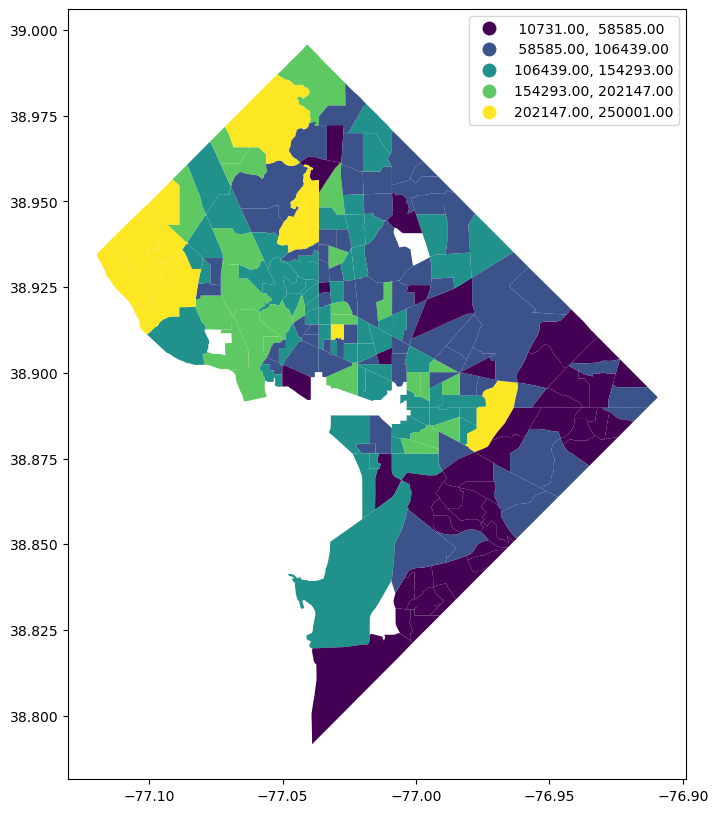

In [42]:
tracts_income.plot(figsize=(12,10),
                 column='Median Household Income',
                 legend=True, 
                 scheme='equal_interval')

Now, let's overlay our earlier folium map with the census tracts and store location markers and create a new interactive choropleth map

In [43]:
m = folium.Map(location=[38.9072, -77.0369], 
               zoom_start = 11,
               tiles='CartoDB positron', 
               attribution='CartoDB')

In [44]:
folium.Choropleth(
                  geo_data=tracts_income, 
                  data=tracts_income,         
                  key_on='feature.properties.FIPS', 
                  columns=['FIPS', 'Median Household Income'], 
                  fill_color='BuPu',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, 
                  legend_name='Median Household Income').add_to(m) 

## Median Household Income by Census Tract in Washington D.C. (Interactive)

In [45]:
m

## Store Locations and Median Household Income by Census Tract in Washington D.C. (Interactive)

In [46]:
for index, row in all_stores.iterrows():
        tooltip_text = row.STORE + ' STORE: ' + row.Type
        folium.Marker(
        [row.LATITUDE,row.LONGITUDE], 
        popup=row.STORE, 
        tooltip=tooltip_text,
        icon=folium.Icon(color=row.color)
    ).add_to(m)
m

I want to add a legend to this map for viewers to understand the distinction between the two colors

In [47]:
from branca.element import Template, MacroElement

template = """
{% macro html(this, kwargs) %}

<!doctype html>
<html lang="en">
<head>
  <meta charset="utf-8">
  <meta name="viewport" content="width=device-width, initial-scale=1">
  <title>jQuery UI Draggable - Default functionality</title>
  <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

  <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
  <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>
  
  <script>
  $( function() {
    $( "#maplegend" ).draggable({
                    start: function (event, ui) {
                        $(this).css({
                            right: "auto",
                            top: "auto",
                            bottom: "auto"
                        });
                    }
                });
});

  </script>
</head>
<body>

 
<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 10px; font-size:14px; right: 20px; bottom: 20px;'>
     
<div class='legend-title'>Legend (draggable!)</div>
<div class='legend-scale'>
  <ul class='legend-labels'>
    <li><span style='background:orange;opacity:0.7;'></span>Grocery Stores</li>
    <li><span style='background:green;opacity:0.7;'></span>Healthy Corner Stores</li>

  </ul>
</div>
</div>
 
</body>
</html>

<style type='text/css'>
  .maplegend .legend-title {
    text-align: left;
    margin-bottom: 5px;
    font-weight: bold;
    font-size: 90%;
    }
  .maplegend .legend-scale ul {
    margin: 0;
    margin-bottom: 5px;
    padding: 0;
    float: left;
    list-style: none;
    }
  .maplegend .legend-scale ul li {
    font-size: 80%;
    list-style: none;
    margin-left: 0;
    line-height: 18px;
    margin-bottom: 2px;
    }
  .maplegend ul.legend-labels li span {
    display: block;
    float: left;
    height: 16px;
    width: 30px;
    margin-right: 5px;
    margin-left: 0;
    border: 1px solid #999;
    }
  .maplegend .legend-source {
    font-size: 80%;
    color: #777;
    clear: both;
    }
  .maplegend a {
    color: #777;
    }
</style>
{% endmacro %}"""

macro = MacroElement()
macro._template = Template(template)

m.get_root().add_child(macro)

m

The above map is showing great information related to income distribution among census tracts, and I also want to create it into a static map. In order to do that, we have to change the projection first and then map.

In [48]:
tracts_income.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [49]:
tracts_income_wm = tracts_income.to_crs(epsg=3857)

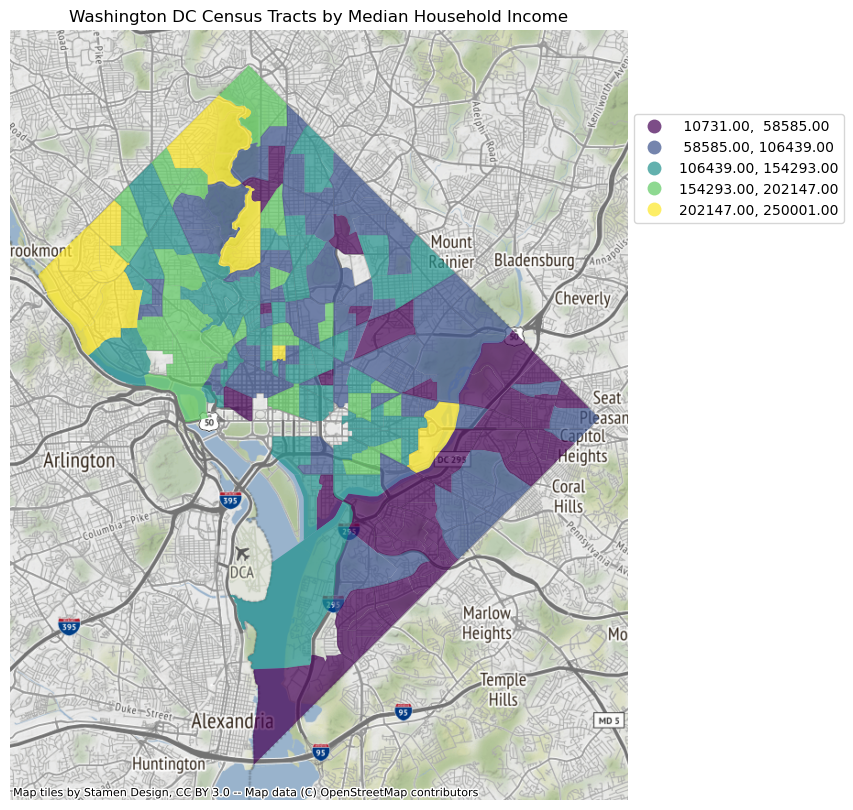

In [50]:
fig, ax = plt.subplots(figsize=(10,10))
tracts_income_wm.plot(figsize=(12,10),
                 column='Median Household Income',
                 legend=True, 
                 ax=ax,
                 legend_kwds={'loc':'upper left','bbox_to_anchor':(1,.9)},
                 scheme='equal_interval', alpha=0.7)
ax.set_title('Washington DC Census Tracts by Median Household Income')
ctx.add_basemap(ax)
ax.set_axis_off()

We decided to also develop an interactive store location map in order to easily pinpoint locations of both healthy corner stores and grocery stores


## Interactive Store Location Map

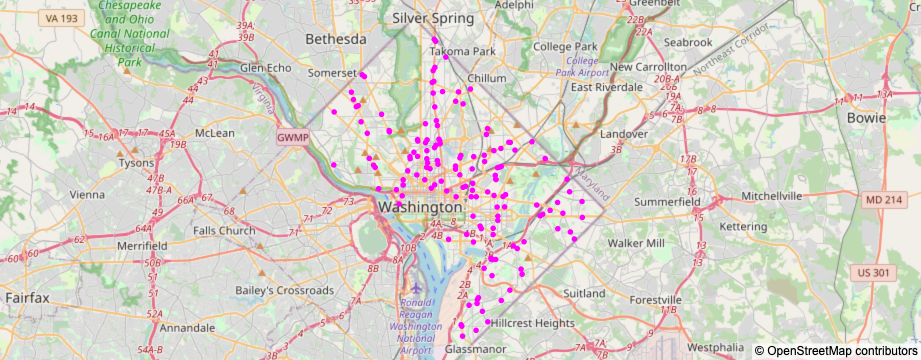

In [51]:
fig = px.scatter_mapbox(all_stores, lat="LATITUDE", lon="LONGITUDE", hover_name="STORE", hover_data=["ADDRESS", "Type"],
                        color_discrete_sequence=["fuchsia"], zoom=10, height=300)

title = "All Store Locations"
fig.update_layout(mapbox_style="open-street-map")
showlegend = True,
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.show()

Our group decided to also develop a map displaying the DC Wards in order to better understand the jurisdiction lines and conduct more specific spatial analysis as part of the final project

## Washington D.C. Wards Map

In [53]:

wards=gpd.read_file('Wards_from_2022.geojson')
wards.head()

,WARD,NAME,REP_NAME,WEB_URL,REP_PHONE,REP_EMAIL,REP_OFFICE,WARD_ID,LABEL,STUSAB,...,P0050010,OBJECTID,GLOBALID,CREATED_USER,CREATED_DATE,LAST_EDITED_USER,LAST_EDITED_DATE,SHAPEAREA,SHAPELEN,geometry
0,8,Ward 8,"Trayon White, Sr.",https://www.dccouncil.us/council/councilmember...,(202) 724-8045,twhite@dccouncil.us,"1350 Pennsylvania Ave, Suite 400, NW 20004",8,Ward 8,DC,...,1745,1,{E31550AE-6FAE-4B74-909F-52B283BFAF68},None,None,None,NaN,0,0,"POLYGON ((-76.99392 38.87771, -77.00336 38.880..."
1,6,Ward 6,Charles Allen,https://www.dccouncil.us/council/councilmember...,(202) 724-8072,callen@dccouncil.us,"1350 Pennsylvania Ave, Suite 406, NW 20004",6,Ward 6,DC,...,887,2,{765C4F49-9292-4BDB-AA24-39F4EE43359F},None,None,None,NaN,0,0,"POLYGON ((-77.00908 38.87162, -77.00908 38.871..."
2,7,Ward 7,Vincent Gray,https://dccouncil.us/council/vincent-gray,(202) 724-8068,vgray@dccouncil.us,"1350 Pennsylvania Ave, Suite 406, NW 20004",7,Ward 7,DC,...,1971,3,{73F07042-7D7F-452B-9BB3-0F87B0EC5418},None,None,None,NaN,0,0,"POLYGON ((-76.94186 38.91854, -76.94200 38.918..."
3,2,Ward 2,Brooke Pinto,https://www.dccouncil.us/council/ward-2-counci...,(202) 724-8058,bpinto@dccouncil.us,"1350 Pennsylvania Ave, Suite 106, NW 20004",2,Ward 2,DC,...,1543,4,{7F8C2A51-427C-45FC-91EB-9693656AED9C},None,None,None,NaN,0,0,"POLYGON ((-77.03270 38.88262, -77.03236 38.883..."
4,1,Ward 1,Brianne Nadeau,https://dccouncil.us/council/brianne-nadeau,(202) 724-8181,bnadeau@dccouncil.us,"1350 Pennsylvania Ave, Suite 102, NW 20004",1,Ward 1,DC,...,752,5,{C3C6E2E7-E68D-49B2-970C-D60675EA7B4B},None,None,None,NaN,0,0,"POLYGON ((-77.03523 38.93743, -77.03570 38.937..."


In [54]:
folium.GeoJson(wards, name="geojson").add_to(m)
folium.LayerControl().add_to(m)
m

## Group Assignments: 
We produced separate notebooks: Rachel conducted data exploration and produced maps on food access and race, Emily conducted data exploration and produced maps on food access and median household income, and created the interactive store map, Brittney produced charts and maps detailing the food environment, and Chris focused on vehicle access and food access.